# 6CS012 - Final Portfolio Assessment 2026
## Part II: Vision Task - Flower Image Classification with CNN


 Install & Import Libraries

In [8]:
import os, time, random, warnings, zipfile
warnings.filterwarnings('ignore')

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

from sklearn.metrics import (
    classification_report, confusion_matrix,
    ConfusionMatrixDisplay, accuracy_score,
    precision_score, recall_score, f1_score
)

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_preprocess

SEED = 42
random.seed(SEED); np.random.seed(SEED); tf.random.set_seed(SEED)

print(f'TensorFlow : {tf.__version__}')
print(f'GPU        : {tf.config.list_physical_devices("GPU")}')

TensorFlow : 2.20.0
GPU        : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]



 Upload & Extract Dataset

In [9]:
from google.colab import files

print(' Upload your Flower Classification zip file when prompted ...')
uploaded = files.upload()
zip_name = list(uploaded.keys())[0]

with zipfile.ZipFile(zip_name, 'r') as z:
    z.extractall('flower_data')

print('\n Extraction complete. Folder structure:')
for root, dirs, files_ in os.walk('flower_data'):
    level = root.replace('flower_data', '').count(os.sep)
    indent = ' ' * 2 * level
    print(f'{indent}{os.path.basename(root)}/')
    if level >= 3:
        print(f'{indent}  ({len(files_)} images)')

 Upload your Flower Classification zip file when prompted ...


Saving Flower Classification-20260416T070240Z-3-001.zip to Flower Classification-20260416T070240Z-3-001 (2).zip

 Extraction complete. Folder structure:
flower_data/
  Flower Classification/
    Train/
      tulip/
        (983 images)
      rose/
        (783 images)
      sunflower/
        (732 images)
      dandelion/
        (1051 images)
      daisy/
        (763 images)
    Test/



# PART A — CNN FROM SCRATCH
Data Understanding, Analysis, Visualisation & Cleaning

Define Paths & Discover Classes

In [29]:
TRAIN_DIR = 'flower_data/Flower Classification/Train'
TEST_DIR  = 'flower_data/Flower Classification/Test'
EXTS      = ('.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG')

CLASS_NAMES = sorted([
    d for d in os.listdir(TRAIN_DIR)
    if os.path.isdir(os.path.join(TRAIN_DIR, d))
])
NUM_CLASSES = len(CLASS_NAMES)
print(f'Classes ({NUM_CLASSES}): {CLASS_NAMES}')

Classes (5): ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


 Dataset Statistics

In [30]:
class_counts    = {}
all_train_paths = []

for cls in CLASS_NAMES:
    cls_dir = os.path.join(TRAIN_DIR, cls)
    imgs = [os.path.join(cls_dir, f) for f in os.listdir(cls_dir) if f.endswith(EXTS)]
    class_counts[cls] = len(imgs)
    all_train_paths.extend(imgs)

total      = sum(class_counts.values())
test_count = len([f for f in os.listdir(TEST_DIR) if f.endswith(EXTS)])

print('=' * 52)
print('            DATASET SUMMARY')
print('=' * 52)
print(f'  Dataset          : Flower Classification')
print(f'  Task             : Multi-class Single-label')
print(f'  Number of classes: {NUM_CLASSES}')
print(f'  Total train imgs : {total}')
print(f'  Test images      : {test_count}')
print('-' * 52)
for cls, cnt in class_counts.items():
    bar = '█' * (cnt // 60)
    print(f'  {cls:<12} : {cnt:>5}  ({cnt/total*100:.1f}%)  {bar}')
print('=' * 52)
ratio = max(class_counts.values()) / min(class_counts.values())
print(f'Max/Min ratio: {ratio:.2f} — slightly imbalanced (dandelion most, sunflower fewest)')
print('Dataset split: 80% Training / 20% Validation')

            DATASET SUMMARY
  Dataset          : Flower Classification
  Task             : Multi-class Single-label
  Number of classes: 5
  Total train imgs : 4312
  Test images      : 5
----------------------------------------------------
  daisy        :   763  (17.7%)  ████████████
  dandelion    :  1051  (24.4%)  █████████████████
  rose         :   783  (18.2%)  █████████████
  sunflower    :   732  (17.0%)  ████████████
  tulip        :   983  (22.8%)  ████████████████
Max/Min ratio: 1.44 — slightly imbalanced (dandelion most, sunflower fewest)
Dataset split: 80% Training / 20% Validation


Class Distribution Plots

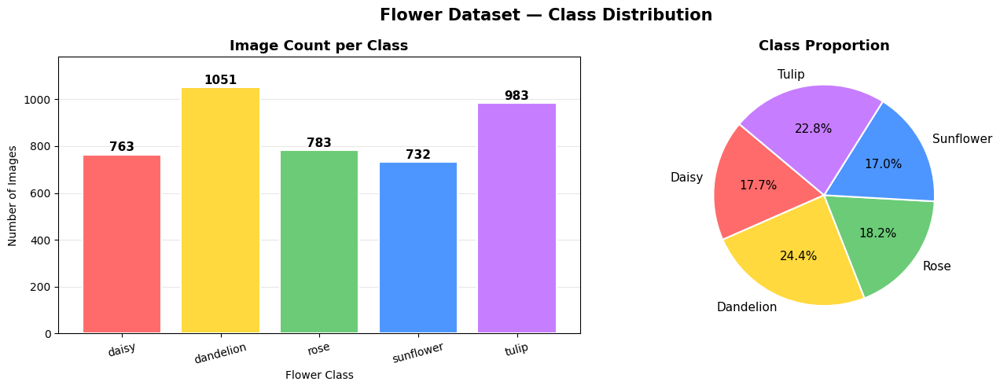

In [31]:
PALETTE = ['#FF6B6B', '#FFD93D', '#6BCB77', '#4D96FF', '#C77DFF']

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

bars = axes[0].bar(class_counts.keys(), class_counts.values(),
                   color=PALETTE, edgecolor='white', linewidth=1.5, zorder=3)
axes[0].set_title('Image Count per Class', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Flower Class'); axes[0].set_ylabel('Number of Images')
axes[0].set_ylim(0, max(class_counts.values()) + 130)
axes[0].tick_params(axis='x', rotation=15)
axes[0].grid(axis='y', alpha=0.3, zorder=0)
for bar, val in zip(bars, class_counts.values()):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 15,
                 str(val), ha='center', fontsize=11, fontweight='bold')

axes[1].pie(class_counts.values(),
            labels=[c.capitalize() for c in class_counts.keys()],
            autopct='%1.1f%%', colors=PALETTE, startangle=140,
            wedgeprops={'edgecolor': 'white', 'linewidth': 1.5},
            textprops={'fontsize': 11})
axes[1].set_title('Class Proportion', fontsize=13, fontweight='bold')

plt.suptitle('Flower Dataset — Class Distribution', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig('class_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

Sample Images per Class

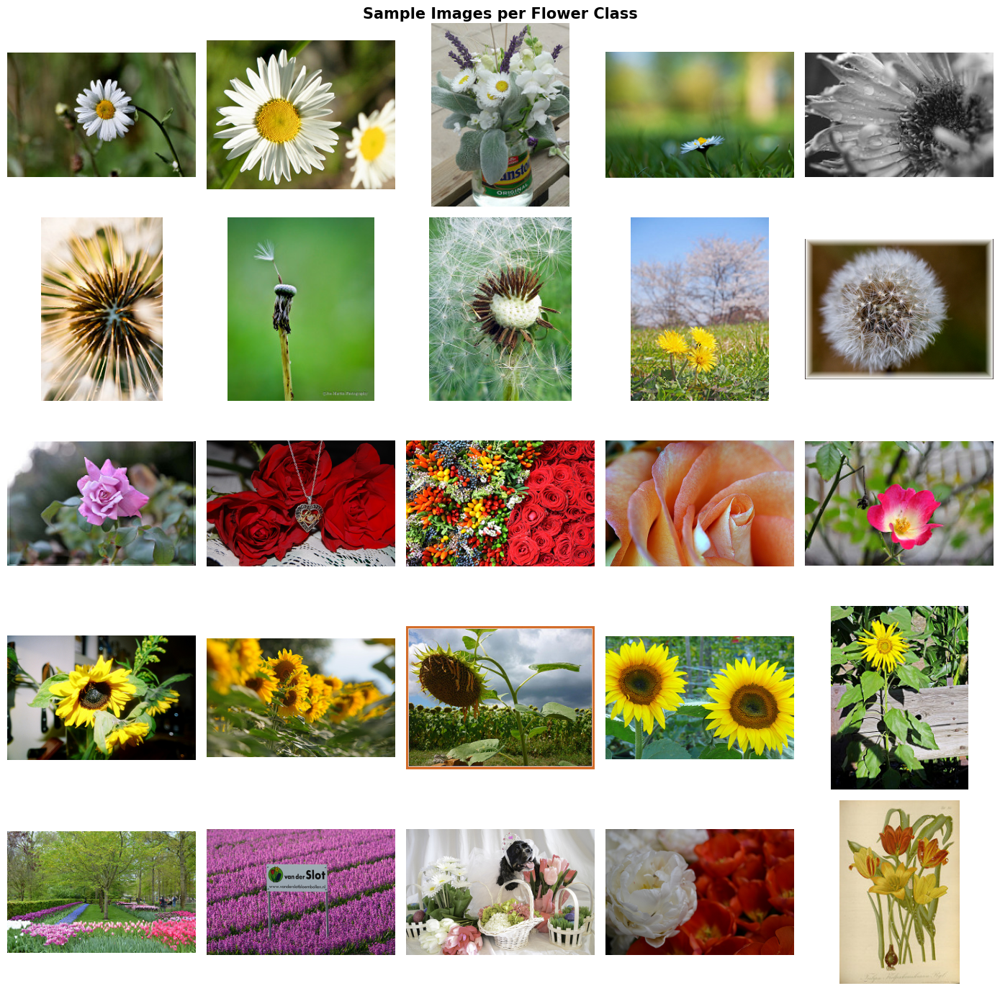

In [41]:
N_SAMPLES = 5
fig, axes = plt.subplots(NUM_CLASSES, N_SAMPLES,
                          figsize=(N_SAMPLES * 2.8, NUM_CLASSES * 2.8))

for r, cls in enumerate(CLASS_NAMES):
    cls_dir = os.path.join(TRAIN_DIR, cls)
    imgs    = random.sample([f for f in os.listdir(cls_dir) if f.endswith(EXTS)], N_SAMPLES)
    for c, fname in enumerate(imgs):
        axes[r, c].imshow(Image.open(os.path.join(cls_dir, fname)))
        axes[r, c].axis('off')
        if c == 0:
            axes[r, c].set_ylabel(cls.capitalize(), fontsize=12, fontweight='bold',
                                   rotation=0, labelpad=65, va='center')

plt.suptitle('Sample Images per Flower Class', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig('sample_images.png', dpi=150, bbox_inches='tight')
plt.show()

Image Size Distribution

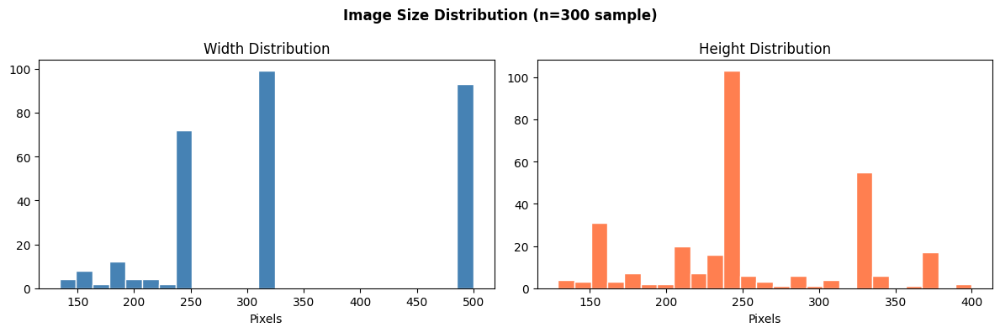

Width  — mean:340px | min:134 | max:500
Height — mean:254px | min:129 | max:400
→ Images vary in size; all resized to 128×128 for scratch CNN training.


In [35]:
sample_paths = random.sample(all_train_paths, min(300, len(all_train_paths)))
widths, heights = [], []
for p in sample_paths:
    with Image.open(p) as img:
        w, h = img.size
        widths.append(w); heights.append(h)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(widths,  bins=25, color='steelblue', edgecolor='white')
axes[0].set_title('Width Distribution');  axes[0].set_xlabel('Pixels')
axes[1].hist(heights, bins=25, color='coral',     edgecolor='white')
axes[1].set_title('Height Distribution'); axes[1].set_xlabel('Pixels')
plt.suptitle('Image Size Distribution (n=300 sample)', fontweight='bold')
plt.tight_layout(); plt.show()

print(f'Width  — mean:{np.mean(widths):.0f}px | min:{min(widths)} | max:{max(widths)}')
print(f'Height — mean:{np.mean(heights):.0f}px | min:{min(heights)} | max:{max(heights)}')
print('→ Images vary in size; all resized to 128×128 for scratch CNN training.')

Preprocessing & Data Generators
**Decisions:** resize to 128×128, normalise [0,1], 80/20 split, augmentation on train only.

In [36]:
IMG_SIZE   = (128, 128)
BATCH_SIZE = 32
VAL_SPLIT  = 0.2

train_datagen = ImageDataGenerator(
    rescale=1./255, rotation_range=30, width_shift_range=0.15,
    height_shift_range=0.15, shear_range=0.10, zoom_range=0.20,
    horizontal_flip=True, fill_mode='nearest', validation_split=VAL_SPLIT
)
val_datagen = ImageDataGenerator(rescale=1./255, validation_split=VAL_SPLIT)

train_gen = train_datagen.flow_from_directory(
    TRAIN_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', subset='training', seed=SEED
)
val_gen = val_datagen.flow_from_directory(
    TRAIN_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', subset='validation', seed=SEED, shuffle=False
)

idx_to_class = {v: k for k, v in train_gen.class_indices.items()}
print(f'Train: {train_gen.samples} | Val: {val_gen.samples}')
print(f'Class map: {train_gen.class_indices}')

Found 3452 images belonging to 5 classes.
Found 860 images belonging to 5 classes.
Train: 3452 | Val: 860
Class map: {'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}


Visualise Augmented Images

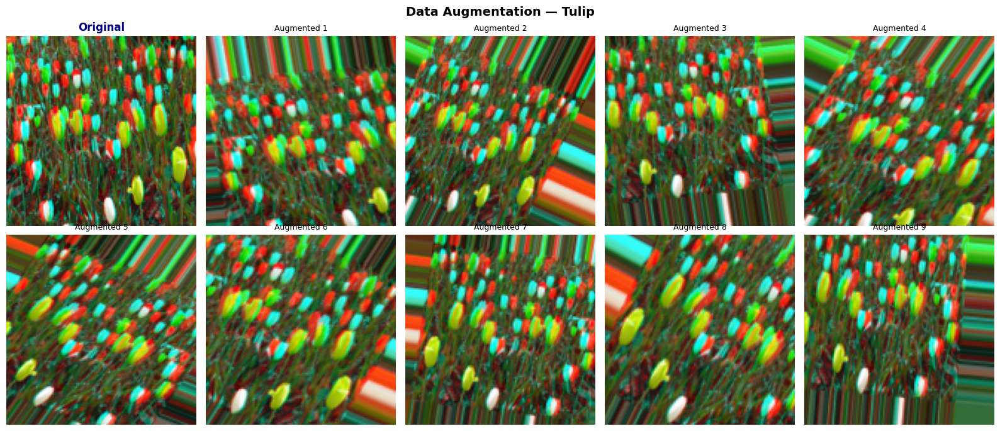

Techniques: rotation ±30°, width/height shift ±15%, shear 10%, zoom 20%, horizontal flip


In [42]:
sample_cls  = CLASS_NAMES[4]
sample_dir  = os.path.join(TRAIN_DIR, sample_cls)
sample_file = next(f for f in os.listdir(sample_dir) if f.lower().endswith('.jpg'))
orig        = np.array(Image.open(os.path.join(sample_dir, sample_file)).resize(IMG_SIZE)) / 255.0
orig_4d     = orig.reshape(1, *orig.shape)

aug_gen  = ImageDataGenerator(rotation_range=30, width_shift_range=0.15,
    height_shift_range=0.15, shear_range=0.1, zoom_range=0.2,
    horizontal_flip=True, fill_mode='nearest')
aug_iter = aug_gen.flow(orig_4d, batch_size=1)

fig, axes = plt.subplots(2, 5, figsize=(16, 7))
axes[0, 0].imshow(orig)
axes[0, 0].set_title('Original', fontweight='bold', color='navy'); axes[0, 0].axis('off')
for i, ax in enumerate(axes.flat[1:]):
    ax.imshow(next(aug_iter)[0]); ax.set_title(f'Augmented {i+1}', fontsize=9); ax.axis('off')

plt.suptitle(f'Data Augmentation — {sample_cls.capitalize()}', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('augmented_samples.png', dpi=150, bbox_inches='tight')
plt.show()
print('Techniques: rotation ±30°, width/height shift ±15%, shear 10%, zoom 20%, horizontal flip')

Baseline CNN Model
**Architecture:** 3 Conv+Pool blocks → Flatten → 3 Dense (FCN) → Softmax output

Build Baseline CNN

In [ ]:
def build_baseline_model(num_classes, input_shape):
    """
    Baseline CNN:
      Block 1 : Conv2D(32,  3x3, ReLU) → MaxPool2D
      Block 2 : Conv2D(64,  3x3, ReLU) → MaxPool2D
      Block 3 : Conv2D(128, 3x3, ReLU) → MaxPool2D
      FCN     : Dense(256) → Dense(128) → Dense(64)
      Output  : Dense(num_classes, softmax)
    """
    model = models.Sequential(name='Baseline_CNN')
    model.add(layers.Conv2D(32,  (3,3), activation='relu', padding='same',
                            input_shape=input_shape, name='conv1'))
    model.add(layers.MaxPooling2D((2,2), name='pool1'))
    model.add(layers.Conv2D(64,  (3,3), activation='relu', padding='same', name='conv2'))
    model.add(layers.MaxPooling2D((2,2), name='pool2'))
    model.add(layers.Conv2D(128, (3,3), activation='relu', padding='same', name='conv3'))
    model.add(layers.MaxPooling2D((2,2), name='pool3'))
    model.add(layers.Flatten(name='flatten'))
    model.add(layers.Dense(256, activation='relu', name='fc1'))
    model.add(layers.Dense(128, activation='relu', name='fc2'))
    model.add(layers.Dense(64,  activation='relu', name='fc3'))
    model.add(layers.Dense(num_classes, activation='softmax', name='output'))
    return model

INPUT_SHAPE    = IMG_SIZE + (3,)
baseline_model = build_baseline_model(NUM_CLASSES, INPUT_SHAPE)
baseline_model.summary()

Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1 (Conv2D)                  │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 256)            │     8,388,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc3 (Dense)                     │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,523,589 (32.51 MB)

 Trainable params: 8,523,589 (32.51 MB)

 Non-trainable params: 0 (0.00 B)

Compile & Train Baseline Model

In [ ]:
baseline_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy', metrics=['accuracy']
)

print('🚀 Training Baseline CNN ...')
t0 = time.time()
history_baseline = baseline_model.fit(
    train_gen, epochs=30, validation_data=val_gen,
    callbacks=[
        EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1),
        ModelCheckpoint('best_baseline.keras', monitor='val_accuracy', save_best_only=True, verbose=0)
    ], verbose=1
)
baseline_train_time = time.time() - t0
print(f'\nBaseline training time: {baseline_train_time/60:.1f} min')

🚀 Training Baseline CNN ...
Epoch 1/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 34s 255ms/step - accuracy: 0.4008 - loss: 1.3471 - val_accuracy: 0.5340 - val_loss: 1.1423 - learning_rate: 0.0010
Epoch 2/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 22s 202ms/step - accuracy: 0.5577 - loss: 1.0797 - val_accuracy: 0.5960 - val_loss: 1.0169 - learning_rate: 0.0010
Epoch 3/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.6132 - loss: 0.9775 - val_accuracy: 0.6194 - val_loss: 0.9529 - learning_rate: 0.0010
Epoch 4/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 22s 202ms/step - accuracy: 0.6547 - loss: 0.8927 - val_accuracy: 0.6674 - val_loss: 0.8709 - learning_rate: 0.0010
Epoch 5/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 21s 196ms/step - accuracy: 0.6652 - loss: 0.8614 - val_accuracy: 0.6686 - val_loss: 0.9707 - learning_rate: 0.0010
Epoch 6/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.6810 - loss: 0.8242 - val_accuracy: 0.6956 - val_loss: 0.8599 - learning_rate: 0.0010
Epoch 7/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 21

Training Curve Plotter (Reusable Helper)

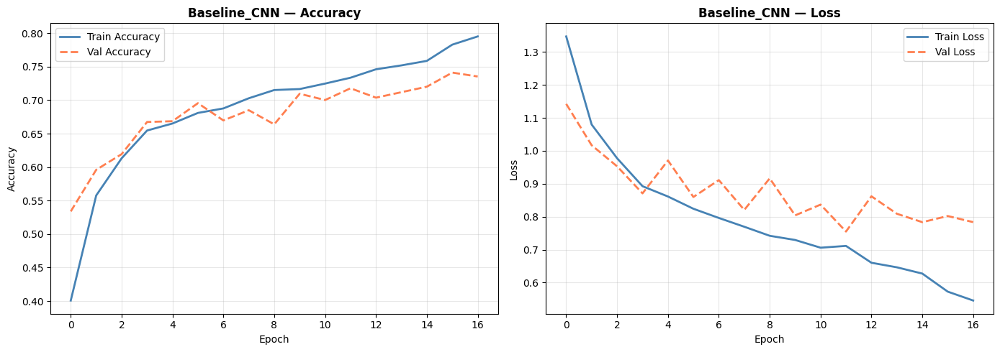

In [ ]:
def plot_history(history, title='Training History', c_train='steelblue', c_val='coral'):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    for ax, key, ylabel in [(axes[0],'accuracy','Accuracy'), (axes[1],'loss','Loss')]:
        ax.plot(history.history[key],           color=c_train, label=f'Train {ylabel}', lw=2)
        ax.plot(history.history[f'val_{key}'],  color=c_val,   label=f'Val {ylabel}',   lw=2, ls='--')
        ax.set_title(f'{title} — {ylabel}', fontweight='bold')
        ax.set_xlabel('Epoch'); ax.set_ylabel(ylabel)
        ax.legend(); ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(f'{title.replace(" ","_")}.png', dpi=150, bbox_inches='tight')
    plt.show()

plot_history(history_baseline, title='Baseline_CNN')

Evaluate Baseline Model

       BASELINE CNN — EVALUATION REPORT
              precision    recall  f1-score   support

       daisy       0.80      0.76      0.78       151
   dandelion       0.79      0.75      0.77       208
        rose       0.61      0.55      0.58       155
   sunflower       0.70      0.79      0.74       145
       tulip       0.68      0.72      0.70       195

    accuracy                           0.72       854
   macro avg       0.72      0.72      0.71       854
weighted avg       0.72      0.72      0.72       854



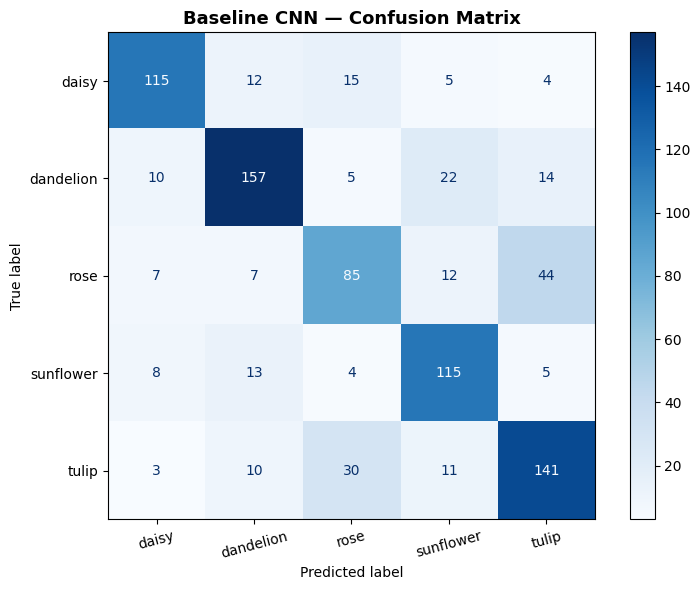

In [ ]:
val_gen.reset()
y_pred_b = np.argmax(baseline_model.predict(val_gen, verbose=0), axis=1)
y_true   = val_gen.classes

print('='*55)
print('       BASELINE CNN — EVALUATION REPORT')
print('='*55)
print(classification_report(y_true, y_pred_b, target_names=CLASS_NAMES))

fig, ax = plt.subplots(figsize=(8, 6))
ConfusionMatrixDisplay(confusion_matrix(y_true, y_pred_b),
                       display_labels=CLASS_NAMES).plot(ax=ax, cmap='Blues')
ax.set_title('Baseline CNN — Confusion Matrix', fontsize=13, fontweight='bold')
plt.xticks(rotation=15); plt.tight_layout()
plt.savefig('baseline_confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

Inference on Sample Validation Images

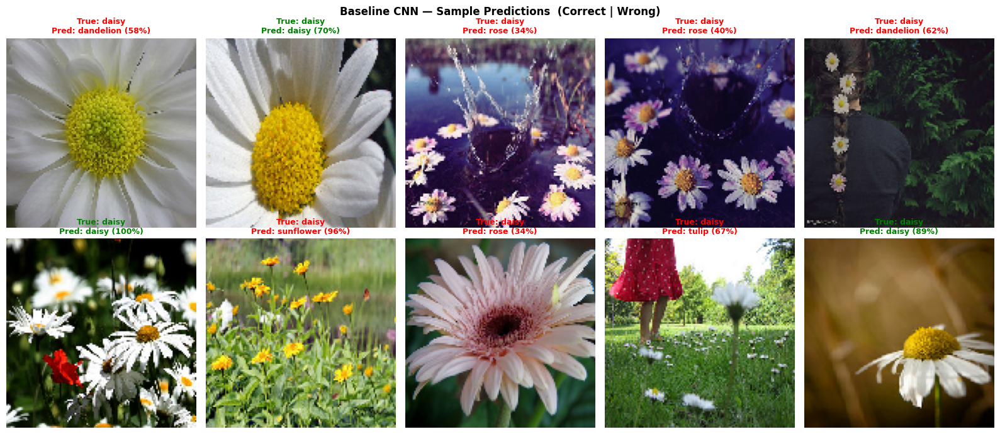

In [ ]:
val_gen.reset()
batch_imgs, batch_labels = next(val_gen)
preds = baseline_model.predict(batch_imgs[:10], verbose=0)

fig, axes = plt.subplots(2, 5, figsize=(16, 7))
for i, ax in enumerate(axes.flat):
    ax.imshow(batch_imgs[i])
    true_lbl = idx_to_class[np.argmax(batch_labels[i])]
    pred_lbl = idx_to_class[np.argmax(preds[i])]
    conf     = np.max(preds[i]) * 100
    color    = 'green' if true_lbl == pred_lbl else 'red'
    ax.set_title(f'True: {true_lbl}\nPred: {pred_lbl} ({conf:.0f}%)',
                 fontsize=9, color=color, fontweight='bold')
    ax.axis('off')
plt.suptitle('Baseline CNN — Sample Predictions  (Correct | Wrong)',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('baseline_predictions.png', dpi=150, bbox_inches='tight')
plt.show()

 Deeper CNN with Regularisation
**Architecture:** 6 Conv+Pool blocks (doubled) + BatchNorm + Dropout → FCN → Softmax

Build Deeper CNN

In [ ]:
def build_deeper_model(num_classes, input_shape):
    """
    Deeper CNN (double baseline layers):
      Block 1: Conv2D(32)×2  + BatchNorm → MaxPool → Dropout(0.25)
      Block 2: Conv2D(64)×2  + BatchNorm → MaxPool → Dropout(0.25)
      Block 3: Conv2D(128)×2 + BatchNorm → MaxPool → Dropout(0.25)
      FCN    : Dense(512,L2)+BN+Dropout(0.5) → Dense(256,L2)+Dropout(0.4) → Dense(128)
      Output : Dense(num_classes, softmax)
    """
    model = models.Sequential(name='Deeper_CNN')

    # Block 1
    model.add(layers.Conv2D(32, (3,3), activation='relu', padding='same', input_shape=input_shape))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(32, (3,3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.25))

    # Block 2
    model.add(layers.Conv2D(64, (3,3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(64, (3,3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.25))

    # Block 3
    model.add(layers.Conv2D(128, (3,3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2D(128, (3,3), activation='relu', padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.25))

    # FCN
    model.add(layers.Flatten())
    model.add(layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(1e-4)))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(1e-4)))
    model.add(layers.Dropout(0.4))
    model.add(layers.Dense(128, activation='relu'))

    # Output
    model.add(layers.Dense(num_classes, activation='softmax'))
    return model

deeper_model = build_deeper_model(NUM_CLASSES, INPUT_SHAPE)
deeper_model.summary()

Model: "Deeper_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    16,777,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 17,233,445 (65.74 MB)

 Trainable params: 17,231,525 (65.73 MB)

 Non-trainable params: 1,920 (7.50 KB)

Train Deeper Model (Adam)

Training Deeper CNN (Adam) ...
Epoch 1/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 61s 331ms/step - accuracy: 0.5510 - loss: 1.4165 - val_accuracy: 0.4356 - val_loss: 1.8753 - learning_rate: 0.0010
Epoch 2/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - accuracy: 0.5895 - loss: 1.3632 - val_accuracy: 0.4602 - val_loss: 1.8051 - learning_rate: 0.0010
Epoch 3/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 24s 227ms/step - accuracy: 0.6144 - loss: 1.3107 - val_accuracy: 0.6030 - val_loss: 1.3535 - learning_rate: 0.0010
Epoch 4/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 25s 237ms/step - accuracy: 0.6383 - loss: 1.2946 - val_accuracy: 0.6323 - val_loss: 1.2754 - learning_rate: 0.0010
Epoch 5/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 25s 229ms/step - accuracy: 0.6608 - loss: 1.2472 - val_accuracy: 0.6218 - val_loss: 1.3137 - learning_rate: 0.0010
Epoch 6/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 23s 217ms/step - accuracy: 0.6804 - loss: 1.2010 - val_accuracy: 0.5785 - val_loss: 1.3927 - learning_rate: 0.0010
Epoch 7/30
107/107 ━━━━━━━━━━━━━━━━━━━━

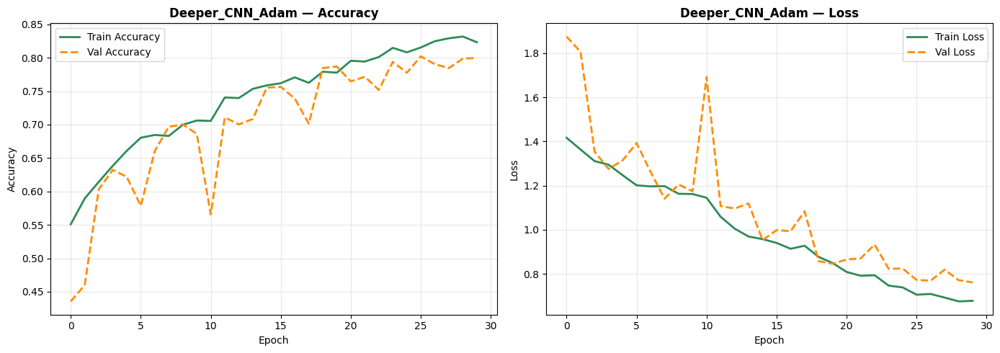

In [ ]:
deeper_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy', metrics=['accuracy']
)
train_gen.reset(); val_gen.reset()

print('Training Deeper CNN (Adam) ...')
t0 = time.time()
history_deeper = deeper_model.fit(
    train_gen, epochs=30, validation_data=val_gen,
    callbacks=[
        EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1),
        ModelCheckpoint('best_deeper.keras', monitor='val_accuracy', save_best_only=True, verbose=0)
    ], verbose=1
)
deeper_train_time = time.time() - t0
print(f'\n Deeper CNN time: {deeper_train_time/60:.1f} min')
plot_history(history_deeper, title='Deeper_CNN_Adam', c_train='seagreen', c_val='darkorange')

Evaluate Deeper Model

          DEEPER CNN — EVALUATION REPORT
              precision    recall  f1-score   support

       daisy       0.94      0.79      0.86       151
   dandelion       0.80      0.88      0.84       208
        rose       0.74      0.68      0.71       155
   sunflower       0.73      0.87      0.79       145
       tulip       0.80      0.76      0.78       195

    accuracy                           0.80       854
   macro avg       0.81      0.80      0.80       854
weighted avg       0.81      0.80      0.80       854



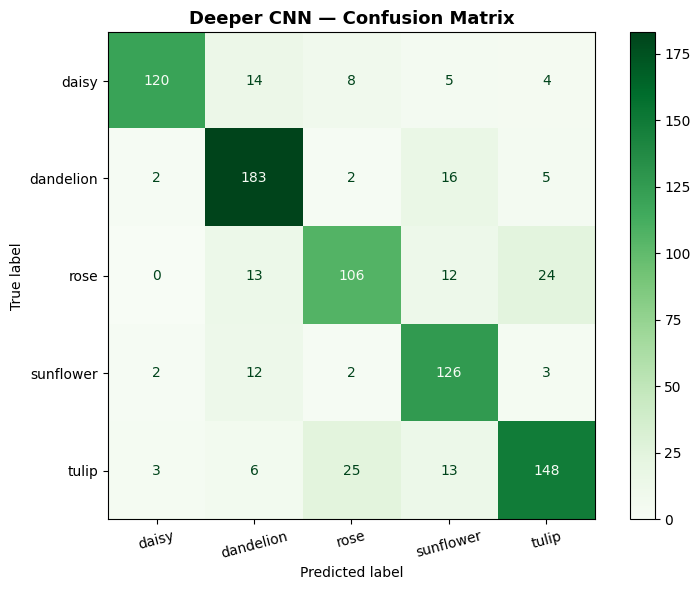

In [ ]:
val_gen.reset()
y_pred_deep = np.argmax(deeper_model.predict(val_gen, verbose=0), axis=1)
y_true      = val_gen.classes

print('='*55)
print('          DEEPER CNN — EVALUATION REPORT')
print('='*55)
print(classification_report(y_true, y_pred_deep, target_names=CLASS_NAMES))

fig, ax = plt.subplots(figsize=(8, 6))
ConfusionMatrixDisplay(confusion_matrix(y_true, y_pred_deep),
                       display_labels=CLASS_NAMES).plot(ax=ax, cmap='Greens')
ax.set_title('Deeper CNN — Confusion Matrix', fontsize=13, fontweight='bold')
plt.xticks(rotation=15); plt.tight_layout()
plt.savefig('deeper_confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

Experimentation & Comparative Analysis

Metrics Helper & Baseline vs Deeper Comparison

Metric           Baseline       Deeper       Diff
Accuracy           0.7178       0.7998 +   0.0820
Precision          0.7185       0.8051 +   0.0867
Recall             0.7178       0.7998 +   0.0820
F1-Score           0.7169       0.7995 +   0.0826
Train Time           6.3m        12.5m


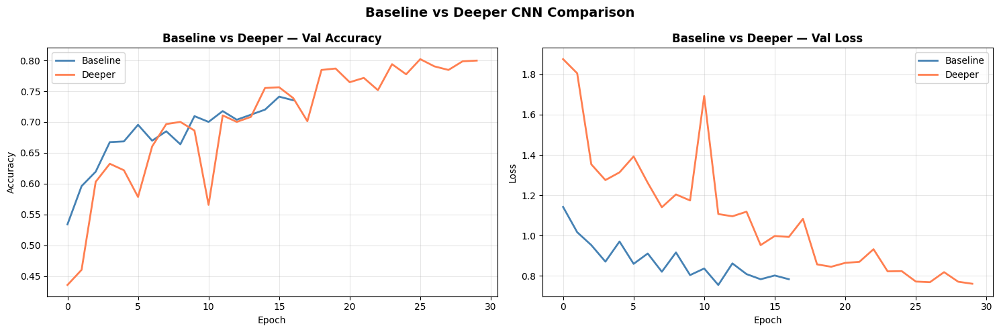

In [ ]:
def get_metrics(y_true, y_pred):
    return {
        'Accuracy' : accuracy_score(y_true, y_pred),
        'Precision': precision_score(y_true, y_pred, average='weighted', zero_division=0),
        'Recall'   : recall_score(y_true,   y_pred, average='weighted', zero_division=0),
        'F1-Score' : f1_score(y_true,       y_pred, average='weighted', zero_division=0)
    }

m_base = get_metrics(y_true, y_pred_b)
m_deep = get_metrics(y_true, y_pred_deep)

print(f'{"Metric":<12} {"Baseline":>12} {"Deeper":>12} {"Diff":>10}')
print('='*48)
for k in m_base:
    d = m_deep[k] - m_base[k]
    print(f'{k:<12} {m_base[k]:>12.4f} {m_deep[k]:>12.4f} {"+" if d>0 else ""}{d:>9.4f}')
print(f'{"Train Time":<12} {baseline_train_time/60:>11.1f}m {deeper_train_time/60:>11.1f}m')

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
for ax, key, ylabel in [(axes[0],'accuracy','Accuracy'), (axes[1],'loss','Loss')]:
    ax.plot(history_baseline.history[f'val_{key}'], label='Baseline', color='steelblue', lw=2)
    ax.plot(history_deeper.history[f'val_{key}'],   label='Deeper',   color='coral',     lw=2)
    ax.set_title(f'Baseline vs Deeper — Val {ylabel}', fontweight='bold')
    ax.set_xlabel('Epoch'); ax.set_ylabel(ylabel)
    ax.legend(); ax.grid(alpha=0.3)
plt.suptitle('Baseline vs Deeper CNN Comparison', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('baseline_vs_deeper.png', dpi=150, bbox_inches='tight')
plt.show()

Optimizer Analysis: SGD vs Adam

 Training Deeper CNN with SGD (Nesterov momentum=0.9) ...
Epoch 1/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 42s 295ms/step - accuracy: 0.3439 - loss: 1.7386 - val_accuracy: 0.4180 - val_loss: 1.5954 - learning_rate: 0.0100
Epoch 2/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 23s 218ms/step - accuracy: 0.4537 - loss: 1.4267 - val_accuracy: 0.4906 - val_loss: 1.4472 - learning_rate: 0.0100
Epoch 3/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 23s 219ms/step - accuracy: 0.4876 - loss: 1.3696 - val_accuracy: 0.5094 - val_loss: 1.3873 - learning_rate: 0.0100
Epoch 4/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 23s 214ms/step - accuracy: 0.5019 - loss: 1.3345 - val_accuracy: 0.4871 - val_loss: 1.4106 - learning_rate: 0.0100
Epoch 5/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 23s 217ms/step - accuracy: 0.5437 - loss: 1.3030 - val_accuracy: 0.5550 - val_loss: 1.2550 - learning_rate: 0.0100
Epoch 6/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 22s 208ms/step - accuracy: 0.5486 - loss: 1.2672 - val_accuracy: 0.4567 - val_loss: 1.4158 - learning_rate: 0.0100
Epoch 7/20
1

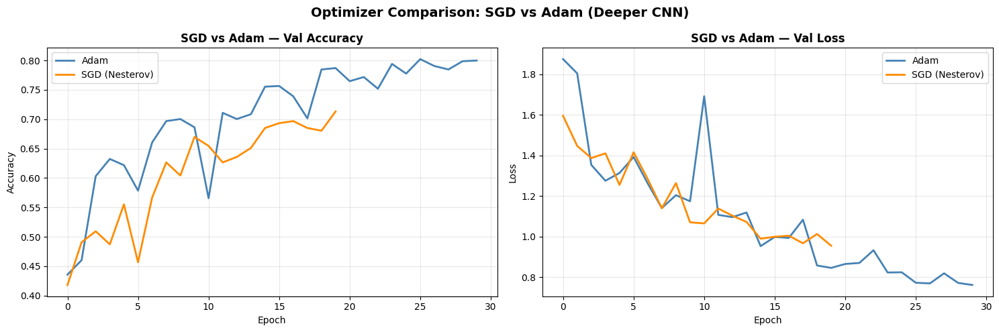


Metric             Adam        SGD
----------------------------------
Accuracy         0.7998     0.7131
Precision        0.8051     0.7103
Recall           0.7998     0.7131
F1-Score         0.7995     0.7098


In [ ]:
deeper_sgd = build_deeper_model(NUM_CLASSES, INPUT_SHAPE)
deeper_sgd.compile(
    optimizer=keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    loss='categorical_crossentropy', metrics=['accuracy']
)
train_gen.reset(); val_gen.reset()

print(' Training Deeper CNN with SGD (Nesterov momentum=0.9) ...')
t0 = time.time()
history_sgd = deeper_sgd.fit(
    train_gen, epochs=20, validation_data=val_gen,
    callbacks=[
        EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)
    ], verbose=1
)
sgd_train_time = time.time() - t0
print(f'\n SGD time: {sgd_train_time/60:.1f} min')

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
for ax, key, ylabel in [(axes[0],'accuracy','Accuracy'), (axes[1],'loss','Loss')]:
    ax.plot(history_deeper.history[f'val_{key}'], label='Adam',           color='steelblue',  lw=2)
    ax.plot(history_sgd.history[f'val_{key}'],    label='SGD (Nesterov)', color='darkorange',  lw=2)
    ax.set_title(f'SGD vs Adam — Val {ylabel}', fontweight='bold')
    ax.set_xlabel('Epoch'); ax.set_ylabel(ylabel)
    ax.legend(); ax.grid(alpha=0.3)
plt.suptitle('Optimizer Comparison: SGD vs Adam (Deeper CNN)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('optimizer_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

val_gen.reset()
y_pred_sgd = np.argmax(deeper_sgd.predict(val_gen, verbose=0), axis=1)
m_sgd = get_metrics(val_gen.classes, y_pred_sgd)
print(f'\n{"Metric":<12} {"Adam":>10} {"SGD":>10}')
print('-'*34)
for k in m_deep:
    print(f'{k:<12} {m_deep[k]:>10.4f} {m_sgd[k]:>10.4f}')

Ablation Study: Remove Dropout

 Training Ablation Model (No Dropout) ...
Epoch 1/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 42s 298ms/step - accuracy: 0.4070 - loss: 2.6796 - val_accuracy: 0.1710 - val_loss: 3.3224
Epoch 2/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 22s 207ms/step - accuracy: 0.4972 - loss: 1.3773 - val_accuracy: 0.2436 - val_loss: 3.1067
Epoch 3/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 23s 215ms/step - accuracy: 0.5478 - loss: 1.1332 - val_accuracy: 0.2377 - val_loss: 1.7158
Epoch 4/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 23s 216ms/step - accuracy: 0.5968 - loss: 1.0390 - val_accuracy: 0.4169 - val_loss: 1.4302
Epoch 5/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 23s 216ms/step - accuracy: 0.6334 - loss: 0.9645 - val_accuracy: 0.5855 - val_loss: 1.0406
Epoch 6/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 23s 214ms/step - accuracy: 0.6439 - loss: 0.9193 - val_accuracy: 0.6347 - val_loss: 0.9876
Epoch 7/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 23s 214ms/step - accuracy: 0.6623 - loss: 0.8629 - val_accuracy: 0.6639 - val_loss: 0.9125
Epoch 8/20
107/107 ━━━━━━━━━━━━━━━━━━━━ 2

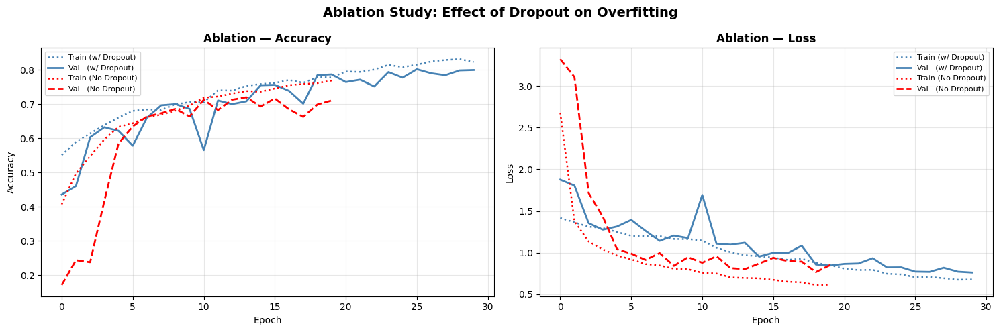


Metric         With Dropout   No Dropout
----------------------------------------
Accuracy             0.7998       0.6991
Precision            0.8051       0.7174
Recall               0.7998       0.6991
F1-Score             0.7995       0.6959


In [ ]:
def build_no_dropout(num_classes, input_shape):
    """Deeper CNN WITHOUT Dropout — ablation study."""
    model = models.Sequential(name='Ablation_No_Dropout')
    for filters in [32, 64, 128]:
        model.add(layers.Conv2D(filters, (3,3), activation='relu', padding='same',
                                **(dict(input_shape=input_shape) if filters==32 else {})))
        model.add(layers.BatchNormalization())
        model.add(layers.Conv2D(filters, (3,3), activation='relu', padding='same'))
        model.add(layers.BatchNormalization())
        model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Flatten())
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dense(num_classes, activation='softmax'))
    return model

ablation_model = build_no_dropout(NUM_CLASSES, INPUT_SHAPE)
ablation_model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss='categorical_crossentropy', metrics=['accuracy']
)
train_gen.reset(); val_gen.reset()
print(' Training Ablation Model (No Dropout) ...')
history_abl = ablation_model.fit(
    train_gen, epochs=20, validation_data=val_gen,
    callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)],
    verbose=1
)
print('Done.')

val_gen.reset()
y_pred_abl = np.argmax(ablation_model.predict(val_gen, verbose=0), axis=1)
m_abl = get_metrics(val_gen.classes, y_pred_abl)

# Overfitting plot
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
for ax, key, ylabel in [(axes[0],'accuracy','Accuracy'), (axes[1],'loss','Loss')]:
    ax.plot(history_deeper.history[key],          label='Train (w/ Dropout)', color='steelblue', lw=1.8, ls=':')
    ax.plot(history_deeper.history[f'val_{key}'], label='Val   (w/ Dropout)', color='steelblue', lw=2)
    ax.plot(history_abl.history[key],             label='Train (No Dropout)', color='red',       lw=1.8, ls=':')
    ax.plot(history_abl.history[f'val_{key}'],    label='Val   (No Dropout)', color='red',       lw=2, ls='--')
    ax.set_title(f'Ablation — {ylabel}', fontweight='bold')
    ax.set_xlabel('Epoch'); ax.set_ylabel(ylabel)
    ax.legend(fontsize=8); ax.grid(alpha=0.3)
plt.suptitle('Ablation Study: Effect of Dropout on Overfitting', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('ablation_dropout.png', dpi=150, bbox_inches='tight')
plt.show()

print(f'\n{"Metric":<12} {"With Dropout":>14} {"No Dropout":>12}')
print('-'*40)
for k in m_deep:
    print(f'{k:<12} {m_deep[k]:>14.4f} {m_abl[k]:>12.4f}')

Part A Summary Comparison Chart

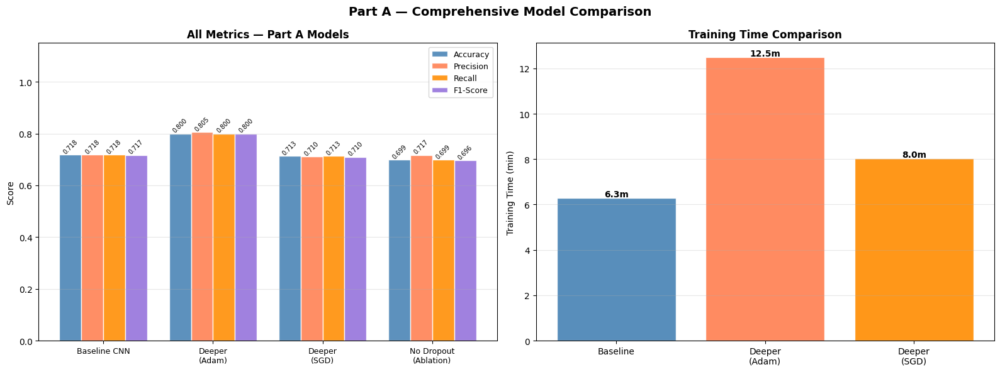

In [ ]:
model_names  = ['Baseline CNN', 'Deeper\n(Adam)', 'Deeper\n(SGD)', 'No Dropout\n(Ablation)']
all_m        = [m_base, m_deep, m_sgd, m_abl]
x = np.arange(len(model_names)); w = 0.20
colors = ['steelblue','coral','darkorange','mediumpurple']

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
for i, (metric, color) in enumerate(zip(['Accuracy','Precision','Recall','F1-Score'], colors)):
    vals = [m[metric] for m in all_m]
    bars = axes[0].bar(x+i*w-1.5*w, vals, w, label=metric, color=color, edgecolor='white', alpha=0.88)
    for bar in bars:
        axes[0].text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.005,
                     f'{bar.get_height():.3f}', ha='center', fontsize=7, rotation=45)
axes[0].set_xticks(x); axes[0].set_xticklabels(model_names, fontsize=9)
axes[0].set_ylim(0,1.15); axes[0].set_ylabel('Score')
axes[0].set_title('All Metrics — Part A Models', fontweight='bold')
axes[0].legend(fontsize=9); axes[0].grid(axis='y', alpha=0.3)

time_labels = ['Baseline','Deeper\n(Adam)','Deeper\n(SGD)']
times = [baseline_train_time/60, deeper_train_time/60, sgd_train_time/60]
tc = ['steelblue','coral','darkorange']
bars2 = axes[1].bar(time_labels, times, color=tc, edgecolor='white', alpha=0.9)
for bar, val in zip(bars2, times):
    axes[1].text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.05,
                 f'{val:.1f}m', ha='center', fontweight='bold')
axes[1].set_ylabel('Training Time (min)')
axes[1].set_title('Training Time Comparison', fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)

plt.suptitle('Part A — Comprehensive Model Comparison', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('part_a_summary.png', dpi=150, bbox_inches='tight')
plt.show()


# PART B — TRANSFER LEARNING
##  — MobileNetV2 Fine-Tuning

**Pre-trained model: MobileNetV2** (ImageNet weights, 224×224 input)  
**Justification:** Lightweight, fast to fine-tune, excellent on medium-sized datasets (~4K images).  
Uses depthwise separable convolutions — far fewer params than VGG/ResNet with competitive accuracy.

**Two-phase strategy:**  
- **Phase 1 – Feature Extraction:** Freeze entire base, train only new head (LR = 1e-3)  
- **Phase 2 – Fine-Tuning:** Unfreeze top 30 layers, very low LR (1e-5) to avoid catastrophic forgetting

 TL Data Generators (224×224)

In [ ]:
TL_IMG_SIZE = (224, 224)

tl_train_datagen = ImageDataGenerator(
    preprocessing_function=mobilenet_preprocess,
    rotation_range=30, width_shift_range=0.15, height_shift_range=0.15,
    shear_range=0.10, zoom_range=0.20, horizontal_flip=True,
    fill_mode='nearest', validation_split=0.20
)
tl_val_datagen = ImageDataGenerator(
    preprocessing_function=mobilenet_preprocess, validation_split=0.20
)

tl_train_gen = tl_train_datagen.flow_from_directory(
    TRAIN_DIR, target_size=TL_IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', subset='training', seed=SEED
)
tl_val_gen = tl_val_datagen.flow_from_directory(
    TRAIN_DIR, target_size=TL_IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', subset='validation', seed=SEED, shuffle=False
)
print(f'TL Train: {tl_train_gen.samples} | TL Val: {tl_val_gen.samples}')

Found 3423 images belonging to 5 classes.
Found 854 images belonging to 5 classes.
TL Train: 3423 | TL Val: 854


Build Transfer Learning Model

In [ ]:
base_model = MobileNetV2(input_shape=TL_IMG_SIZE+(3,), include_top=False, weights='imagenet')
base_model.trainable = False
print(f'Base layers: {len(base_model.layers)} | Params (frozen): {base_model.count_params():,}')

# Custom classifier head
inputs  = keras.Input(shape=TL_IMG_SIZE+(3,))
x       = base_model(inputs, training=False)
x       = layers.GlobalAveragePooling2D()(x)
x       = layers.Dense(256, activation='relu')(x)
x       = layers.BatchNormalization()(x)
x       = layers.Dropout(0.4)(x)
x       = layers.Dense(128, activation='relu')(x)
x       = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

tl_model = keras.Model(inputs, outputs, name='MobileNetV2_TL')
tl_model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Base layers: 154 | Params (frozen): 2,257,984


Model: "MobileNetV2_TL"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,620,485 (10.00 MB)

 Trainable params: 361,989 (1.38 MB)

 Non-trainable params: 2,258,496 (8.62 MB)

Phase 1: Feature Extraction

In [ ]:
tl_model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss='categorical_crossentropy', metrics=['accuracy']
)
print('🚀 Phase 1: Feature Extraction (frozen base) ...')
t0 = time.time()
history_tl_p1 = tl_model.fit(
    tl_train_gen, epochs=15, validation_data=tl_val_gen,
    callbacks=[
        EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, verbose=1)
    ], verbose=1
)
phase1_time = time.time() - t0
print(f'Phase 1: {phase1_time/60:.1f} min')

🚀 Phase 1: Feature Extraction (frozen base) ...
Epoch 1/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 99s 699ms/step - accuracy: 0.7222 - loss: 0.7819 - val_accuracy: 0.8735 - val_loss: 0.3582 - learning_rate: 0.0010
Epoch 2/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 47s 437ms/step - accuracy: 0.8250 - loss: 0.4862 - val_accuracy: 0.8607 - val_loss: 0.4169 - learning_rate: 0.0010
Epoch 3/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step - accuracy: 0.8355 - loss: 0.4281
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
107/107 ━━━━━━━━━━━━━━━━━━━━ 45s 418ms/step - accuracy: 0.8414 - loss: 0.4274 - val_accuracy: 0.8689 - val_loss: 0.3965 - learning_rate: 0.0010
Epoch 4/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 46s 427ms/step - accuracy: 0.8647 - loss: 0.3782 - val_accuracy: 0.8630 - val_loss: 0.3862 - learning_rate: 5.0000e-04
Epoch 5/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 46s 426ms/step - accuracy: 0.8776 - loss: 0.3311 - val_accuracy: 0.8782 - val_loss: 0.3562 - learning_rate: 5.0000e-04
Epoch 6/15
107/1

 Phase 2: Fine-Tuning (Top 30 Layers)

In [ ]:
base_model.trainable = True
fine_tune_from = len(base_model.layers) - 30
for layer in base_model.layers[:fine_tune_from]:
    layer.trainable = False

print(f'Unfrozen: {sum(1 for l in base_model.layers if l.trainable)}/{len(base_model.layers)} layers')

tl_model.compile(
    optimizer=keras.optimizers.Adam(1e-5),   # very low LR to avoid catastrophic forgetting
    loss='categorical_crossentropy', metrics=['accuracy']
)
tl_train_gen.reset(); tl_val_gen.reset()

print('🚀 Phase 2: Fine-Tuning (LR=1e-5) ...')
t0 = time.time()
history_tl_p2 = tl_model.fit(
    tl_train_gen, epochs=15, validation_data=tl_val_gen,
    callbacks=[
        EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, verbose=1),
        ModelCheckpoint('best_tl_model.keras', monitor='val_accuracy', save_best_only=True, verbose=0)
    ], verbose=1
)
phase2_time   = time.time() - t0
tl_total_time = phase1_time + phase2_time
print(f'Phase 2: {phase2_time/60:.1f} min | Total TL: {tl_total_time/60:.1f} min')

Unfrozen: 30/154 layers
🚀 Phase 2: Fine-Tuning (LR=1e-5) ...
Epoch 1/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 80s 587ms/step - accuracy: 0.8335 - loss: 0.4669 - val_accuracy: 0.8981 - val_loss: 0.3849 - learning_rate: 1.0000e-05
Epoch 2/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 45s 418ms/step - accuracy: 0.8650 - loss: 0.3952 - val_accuracy: 0.8958 - val_loss: 0.4062 - learning_rate: 1.0000e-05
Epoch 3/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 46s 433ms/step - accuracy: 0.8697 - loss: 0.3468 - val_accuracy: 0.8993 - val_loss: 0.3968 - learning_rate: 1.0000e-05
Epoch 4/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step - accuracy: 0.8899 - loss: 0.3117
Epoch 4: ReduceLROnPlateau reducing learning rate to 2.9999999242136253e-06.
107/107 ━━━━━━━━━━━━━━━━━━━━ 46s 427ms/step - accuracy: 0.8829 - loss: 0.3296 - val_accuracy: 0.8981 - val_loss: 0.4005 - learning_rate: 1.0000e-05
Epoch 5/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 45s 420ms/step - accuracy: 0.8820 - loss: 0.3486 - val_accuracy: 0.8993 - val_loss: 0.3735 - learning_rate: 3

TL Training Curves (Phase 1 + Phase 2 Combined)

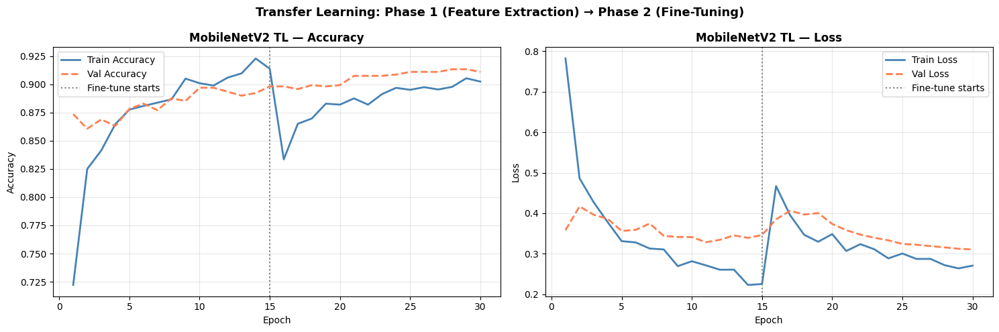

In [ ]:
combined = {k: history_tl_p1.history[k] + history_tl_p2.history[k]
            for k in history_tl_p1.history}
p1_len  = len(history_tl_p1.history['accuracy'])
erange  = range(1, len(combined['accuracy'])+1)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
for ax, key, ylabel in [(axes[0],'accuracy','Accuracy'), (axes[1],'loss','Loss')]:
    ax.plot(erange, combined[key],           color='steelblue', label=f'Train {ylabel}', lw=2)
    ax.plot(erange, combined[f'val_{key}'],  color='coral',     label=f'Val {ylabel}',   lw=2, ls='--')
    ax.axvline(x=p1_len, color='grey', ls=':', lw=1.5, label='Fine-tune starts')
    ax.set_title(f'MobileNetV2 TL — {ylabel}', fontweight='bold')
    ax.set_xlabel('Epoch'); ax.set_ylabel(ylabel)
    ax.legend(); ax.grid(alpha=0.3)
plt.suptitle('Transfer Learning: Phase 1 (Feature Extraction) → Phase 2 (Fine-Tuning)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('tl_training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

Evaluate Transfer Learning Model

   MobileNetV2 TRANSFER LEARNING — EVALUATION
              precision    recall  f1-score   support

       daisy       0.90      0.93      0.92       151
   dandelion       0.94      0.90      0.92       208
        rose       0.93      0.88      0.90       155
   sunflower       0.88      0.92      0.90       145
       tulip       0.91      0.93      0.92       195

    accuracy                           0.91       854
   macro avg       0.91      0.91      0.91       854
weighted avg       0.91      0.91      0.91       854



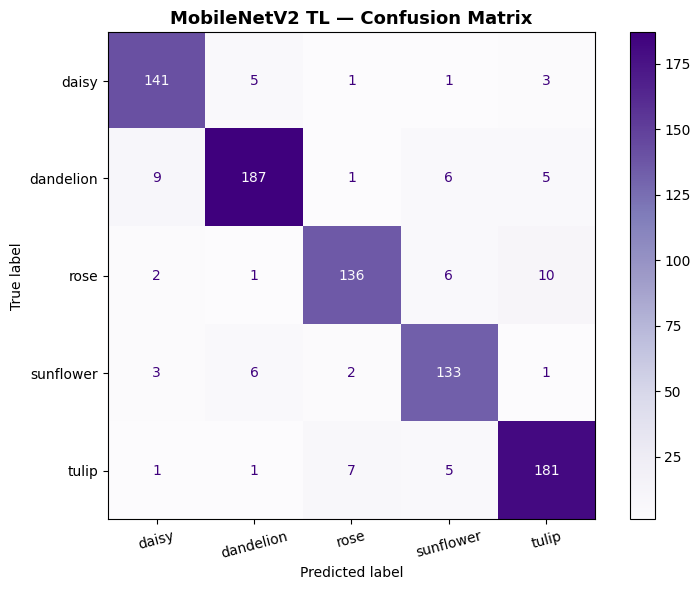

In [ ]:
tl_val_gen.reset()
y_pred_tl = np.argmax(tl_model.predict(tl_val_gen, verbose=0), axis=1)
y_true_tl = tl_val_gen.classes

print('='*55)
print('   MobileNetV2 TRANSFER LEARNING — EVALUATION')
print('='*55)
print(classification_report(y_true_tl, y_pred_tl, target_names=CLASS_NAMES))

fig, ax = plt.subplots(figsize=(8, 6))
ConfusionMatrixDisplay(confusion_matrix(y_true_tl, y_pred_tl),
                       display_labels=CLASS_NAMES).plot(ax=ax, cmap='Purples')
ax.set_title('MobileNetV2 TL — Confusion Matrix', fontsize=13, fontweight='bold')
plt.xticks(rotation=15); plt.tight_layout()
plt.savefig('tl_confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

TL Sample Predictions

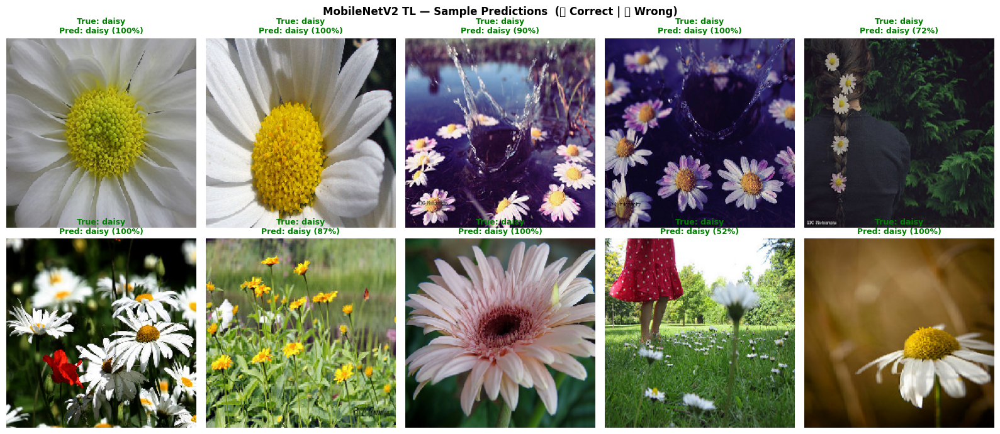

In [ ]:
tl_val_gen.reset()
batch_tl_imgs, batch_tl_labels = next(tl_val_gen)
preds_tl = tl_model.predict(batch_tl_imgs[:10], verbose=0)

fig, axes = plt.subplots(2, 5, figsize=(16, 7))
for i, ax in enumerate(axes.flat):
    img_disp = (batch_tl_imgs[i] / 2.0 + 0.5).clip(0, 1)   # reverse MobileNet preprocess
    ax.imshow(img_disp)
    true_lbl = idx_to_class[np.argmax(batch_tl_labels[i])]
    pred_lbl = idx_to_class[np.argmax(preds_tl[i])]
    conf     = np.max(preds_tl[i]) * 100
    color    = 'green' if true_lbl == pred_lbl else 'red'
    ax.set_title(f'True: {true_lbl}\nPred: {pred_lbl} ({conf:.0f}%)',
                 fontsize=9, color=color, fontweight='bold')
    ax.axis('off')
plt.suptitle('MobileNetV2 TL — Sample Predictions  (Correct |  Wrong)',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('tl_sample_predictions.png', dpi=150, bbox_inches='tight')
plt.show()

Predict on Test Images

Test images found: 5

110472418_87b6a3aa98_m.jpg
  #1: rose         98.65%
  #2: tulip        1.05%
  #3: dandelion    0.12%

113960470_38fab8f2fb_m.jpg
  #1: tulip        97.26%
  #2: daisy        1.74%
  #3: rose         0.97%

153210866_03cc9f2f36.jpg
  #1: daisy        100.00%
  #2: tulip        0.00%
  #3: rose         0.00%

16159487_3a6615a565_n.jpg
  #1: dandelion    99.98%
  #2: daisy        0.01%
  #3: sunflower    0.00%

40410814_fba3837226_n.jpg
  #1: sunflower    100.00%
  #2: dandelion    0.00%
  #3: daisy        0.00%


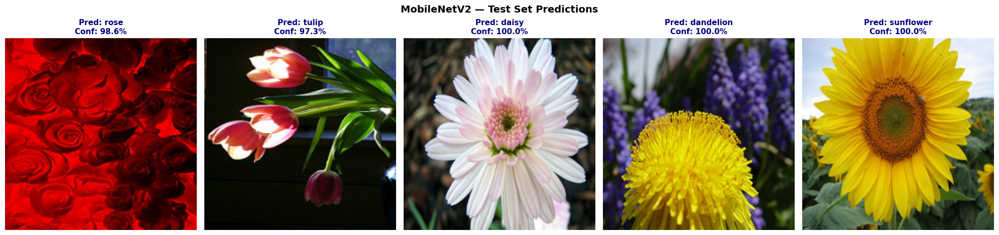

In [ ]:
test_files = sorted([f for f in os.listdir(TEST_DIR) if f.endswith(EXTS)])
print(f'Test images found: {len(test_files)}')

n = len(test_files)
fig, axes = plt.subplots(1, n, figsize=(4*n, 5))
if n == 1: axes = [axes]

for ax, fname in zip(axes, test_files):
    img    = Image.open(os.path.join(TEST_DIR, fname)).convert('RGB')
    arr    = np.array(img.resize(TL_IMG_SIZE), dtype=np.float32)
    inp    = np.expand_dims(mobilenet_preprocess(arr.copy()), axis=0)
    probs  = tl_model.predict(inp, verbose=0)[0]
    pred   = CLASS_NAMES[np.argmax(probs)]
    conf   = np.max(probs) * 100

    ax.imshow(img.resize(TL_IMG_SIZE))
    ax.set_title(f'Pred: {pred}\nConf: {conf:.1f}%', fontsize=11, fontweight='bold', color='navy')
    ax.axis('off')

    top3 = np.argsort(probs)[::-1][:3]
    print(f'\n{fname}')
    for r, idx in enumerate(top3):
        print(f'  #{r+1}: {CLASS_NAMES[idx]:<12} {probs[idx]*100:.2f}%')

plt.suptitle('MobileNetV2 — Test Set Predictions', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('test_predictions.png', dpi=150, bbox_inches='tight')
plt.show()

Final All-Model Comparison

Model                       Accuracy  Precision     Recall   F1-Score
Baseline CNN                  0.7178     0.7185     0.7178     0.7169
Deeper (Adam)                 0.7998     0.8051     0.7998     0.7995
Deeper (SGD)                  0.7131     0.7103     0.7131     0.7098
No Dropout (Ablation)         0.6991     0.7174     0.6991     0.6959
MobileNetV2 TL                0.9110     0.9117     0.9110     0.9110  ← BEST


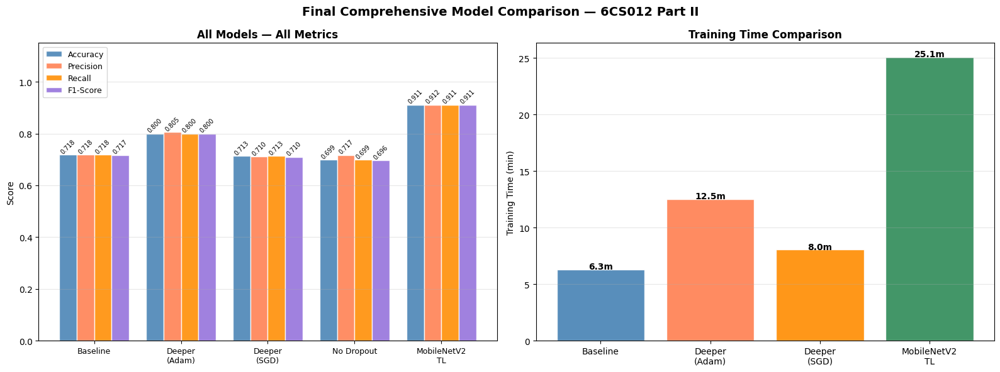

In [ ]:
m_tl = get_metrics(y_true_tl, y_pred_tl)

all_names   = ['Baseline CNN','Deeper (Adam)','Deeper (SGD)','No Dropout (Ablation)','MobileNetV2 TL']
all_m_list  = [m_base, m_deep, m_sgd, m_abl, m_tl]

print(f'{"Model":<25} {"Accuracy":>10} {"Precision":>10} {"Recall":>10} {"F1-Score":>10}')
print('='*67)
for name, m in zip(all_names, all_m_list):
    best = '  ← BEST' if m['Accuracy'] == max(mm['Accuracy'] for mm in all_m_list) else ''
    print(f'{name:<25} {m["Accuracy"]:>10.4f} {m["Precision"]:>10.4f} {m["Recall"]:>10.4f} {m["F1-Score"]:>10.4f}{best}')

# Plot
short_names = ['Baseline','Deeper\n(Adam)','Deeper\n(SGD)','No Dropout','MobileNetV2\nTL']
x = np.arange(len(short_names)); w = 0.20
colors4 = ['steelblue','coral','darkorange','mediumpurple']

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
for i, (metric, color) in enumerate(zip(['Accuracy','Precision','Recall','F1-Score'], colors4)):
    vals = [m[metric] for m in all_m_list]
    bars = axes[0].bar(x+i*w-1.5*w, vals, w, label=metric, color=color, edgecolor='white', alpha=0.88)
    for bar in bars:
        axes[0].text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.005,
                     f'{bar.get_height():.3f}', ha='center', fontsize=7, rotation=45)
axes[0].set_xticks(x); axes[0].set_xticklabels(short_names, fontsize=9)
axes[0].set_ylim(0, 1.15); axes[0].set_ylabel('Score')
axes[0].set_title('All Models — All Metrics', fontweight='bold')
axes[0].legend(fontsize=9); axes[0].grid(axis='y', alpha=0.3)

time_labels = ['Baseline','Deeper\n(Adam)','Deeper\n(SGD)','MobileNetV2\nTL']
times = [baseline_train_time/60, deeper_train_time/60, sgd_train_time/60, tl_total_time/60]
tc    = ['steelblue','coral','darkorange','seagreen']
bars2 = axes[1].bar(time_labels, times, color=tc, edgecolor='white', alpha=0.9)
for bar, val in zip(bars2, times):
    axes[1].text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.05,
                 f'{val:.1f}m', ha='center', fontweight='bold')
axes[1].set_ylabel('Training Time (min)')
axes[1].set_title('Training Time Comparison', fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)

plt.suptitle('Final Comprehensive Model Comparison — 6CS012 Part II',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('final_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

Save Best Model & Download

In [ ]:
# Save the best performing model (Transfer Learning)
tl_model.save('flower_classifier_mobilenetv2.keras')
print('Model saved: flower_classifier_mobilenetv2.keras')

# Optional: download model
# from google.colab import files
# files.download('flower_classifier_mobilenetv2.keras')

Model saved: flower_classifier_mobilenetv2.keras


Final Hardware & Results Summary

In [ ]:
gpus = tf.config.list_physical_devices('GPU')

print('='*62)
print('        FINAL SUMMARY — 6CS012 PART II VISION TASK')
print('='*62)
print(f'  Hardware            : {gpus[0].name if gpus else "CPU"}')
print(f'  Accelerator         : {"Google Colab GPU (T4)" if gpus else "CPU only"}')
print(f'  Image size (Scratch): {IMG_SIZE}')
print(f'  Image size (TL)     : {TL_IMG_SIZE}')
print(f'  Batch size          : {BATCH_SIZE}')
print(f'  Classes             : {CLASS_NAMES}')
print(f'  Training samples    : {train_gen.samples}')
print(f'  Validation samples  : {val_gen.samples}')
print('-'*62)
print('  TRAINING TIMES:')
for name, t in zip(
    ['Baseline CNN      ','Deeper CNN (Adam) ','Deeper CNN (SGD)  ','MobileNetV2 TL    '],
    [baseline_train_time, deeper_train_time, sgd_train_time, tl_total_time]
):
    print(f'    {name}: {t/60:.1f} min')
print('-'*62)
print('  FINAL RESULTS:')
print(f'  {"Model":<25} {"Accuracy":>10} {"F1-Score":>10}')
print('  '+'-'*47)
for name, m in zip(all_names, all_m_list):
    best = ' ← BEST' if m['Accuracy'] == max(mm['Accuracy'] for mm in all_m_list) else ''
    print(f'  {name:<25} {m["Accuracy"]:>10.4f} {m["F1-Score"]:>10.4f}{best}')
print('='*62)
print()
print('  KEY FINDINGS:')
print('  1. Deeper CNN + BatchNorm + Dropout outperforms Baseline CNN.')
print('  2. Adam converges faster and achieves higher accuracy than SGD.')
print('  3. Ablation confirms Dropout is essential — removing it causes clear overfitting.')
print('  4. MobileNetV2 Transfer Learning achieves best overall performance,')
print('     validating the power of ImageNet pre-trained features for small datasets.')
print('  5. Data augmentation was critical to prevent overfitting in all scratch models.')

        FINAL SUMMARY — 6CS012 PART II VISION TASK
  Hardware            : /physical_device:GPU:0
  Accelerator         : Google Colab GPU (T4)
  Image size (Scratch): (128, 128)
  Image size (TL)     : (224, 224)
  Batch size          : 32
  Classes             : ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
  Training samples    : 3423
  Validation samples  : 854
--------------------------------------------------------------
  TRAINING TIMES:
    Baseline CNN      : 6.3 min
    Deeper CNN (Adam) : 12.5 min
    Deeper CNN (SGD)  : 8.0 min
    MobileNetV2 TL    : 25.1 min
--------------------------------------------------------------
  FINAL RESULTS:
  Model                       Accuracy   F1-Score
  -----------------------------------------------
  Baseline CNN                  0.7178     0.7169
  Deeper (Adam)                 0.7998     0.7995
  Deeper (SGD)                  0.7131     0.7098
  No Dropout (Ablation)         0.6991     0.6959
  MobileNetV2 TL                0.